# Coursework 2: Learning with Images
_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Luca Morreale, Pradyumna Reddy, Sanjeev Muralikrishnan & Animesh Karnewar__

The total points for this exercise are 100.

Please refer to Moodle submission page for the due date.


# Submission:

Coursework submissions must comprise of this **single** jupyter notebook, containing your code and written comments. Cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any ways. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated. However, feel free to change and experiment with various hyperparameters.

Note that only the imported packages are allowed to be used. 

In case you are suspected of plagiarism you might be requested to present your work in a one-to-one session (date to be decided) demonstrating what you have implemented.

**Questions:**

[Question 1](#question1): Image, audio; all the same (20 points)

[Question 2](#question2): Denoising (35 points)

[Question 3](#question3): Auto-encoder and Variational AutoEncoder (45 points)

## Datasets

All the datasets must be contained in the `Datasets` folder at the same level of the notebook.
In this courswork you are going to use MNIST, CelebA-HQ, audio data and noisy images. Each dataset is used in a specific exercise. The data paths are already present in the code, please **do not** change them.

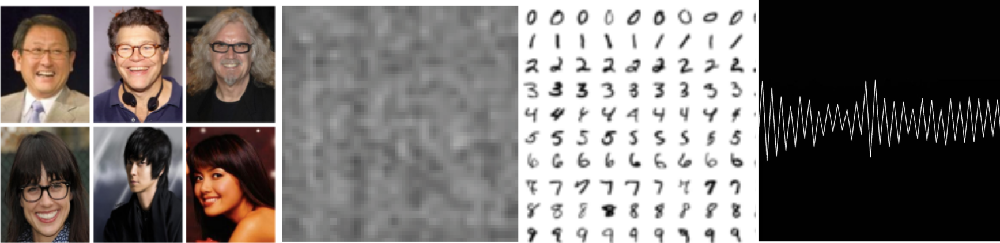

## Trained Models zip for marking

Once you are done with the assignment, create a zip file of your trained models and share an storage link the below cell:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

## Packages

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [1]:
import IPython
import numpy as np
import torch
import random
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn import Module
from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
import os
from pathlib import Path
import torchvision
import PIL
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import torchvision.transforms.functional as TF
import scipy
from tqdm.auto import tqdm
from torchvision.utils import make_grid
from scipy.io.wavfile import read


In [2]:
!pip3 install scikit-image

In [2]:
from skimage.metrics import peak_signal_noise_ratio

: 

: 

In [1]:
# install prettytable and uncomment to use count_paramters function
from prettytable import PrettyTable


In [2]:
# install livelossplot and uncomment below to plot losses live (while training) <- highly suggested
from livelossplot import PlotLosses


Set random seed

In [4]:
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)


Set device

In [2]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)


Using device: cpu


Create folders for 1. saving models and 2. saving visual logs.

In [6]:
models_dir = Path("./models")
logs_dir = Path("./logs")

models_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)


### Utility functions

In [7]:
def plot_images(images, titles, texts):
    N_cols = len(images)
    N_rows = len(images[0])

    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))

    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])

    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j, i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j, i].imshow(img, interpolation='nearest')
            axs[j, i].axis('off')
            if texts is not None:
                axs[j, i].text(0.5, -0.1, str(texts[j][i])[:4], size=10,
                               ha="center", transform=axs[j, i].transAxes)
    plt.show()


def l1_loss(x, y):
    return np.mean(np.abs(x-y))


def count_parameters(model):
    # you can use this function to print number parameters per layer
    # install prettytable and uncomment import to use count_paramters function
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad:
            continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params += param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params


def plot_fftfreq(frequency, amplitude_before_filtering, amplitude_after_filtering=None):
    plt.figure(figsize=(20, 5))
    plt.ylabel("Amplitude")
    plt.xlabel("Frequency")
    plt.plot(frequency, np.abs(amplitude_before_filtering), label='before')

    if type(amplitude_after_filtering) != type(None):
        plt.plot(frequency, np.abs(amplitude_after_filtering), label='after')

    plt.legend()
    plt.show()


def plot_waveform(input_audio, filtered_audio):
    plt.figure(figsize=(20, 5))
    plt.title("Input (red) and Output (green)")
    plt.plot(input_audio, c='r', label='input')
    plt.plot(filtered_audio, c='g', label='output')
    plt.show()


def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()


## 1. Image, audio; all the same (20 points)
<a name='question1'></a>

[a)](#question1a) Implement a filter to remove low temporal frequencies from the audio file `audio_clip.wav`, provided under `Datasets/Filtering/` (loading code is already provided). Implement a version using FFT (`highpass_fft_filter_audio`)(**2 points**) and a version using moving average (`highpass_normal_filter_audio`) (**2 points**), discuss which version, when and why is better (**1 points**).

[b)](#question1b) Implement a filter to find vertical edges in an image. We provide a sample file `image.png` under
`Datasets/Filtering/` for testing. Apply your filter to this image. (**8 points**) Implement the filter without for loops (**2 points**).

[c)](#question1c) Implement a function to modify an image such that the modified image is visually different from the original but has the same output as the original when you perform edge detection.(**5 points**).

(Reference example: One of the changes that we implemented yields an L1 distance of 84.993 between the original image and the modified image, while has 0.0 L1 distance between the filtered outputs of both.)

**Question 1.a**
<a name='question1a'></a>

Implement a filter to remove low temporal frequencies

<font color='red'>Hint:</font> use "fft", "fftfreq" functions from "np.fft".


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [8]:
def highpass_fft_filter_audio(audio):
    # solution
    frequencies = np.fft.fftfreq(len(audio))
    high_fft = np.fft.fft(audio)
    amplitude_before_filtering = np.abs(high_fft)
    min_frequency = 0.025 # threshold
    filtered_fft = np.copy(high_fft)
    filtered_fft[abs(frequencies) < abs(min_frequency)] = 0
    filtered_audio = np.fft.ifft(filtered_fft).real
    amplitude_after_filtering = np.abs(filtered_fft)
    # end_solution
    return filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering


In [332]:
def highpass_normal_filter_audio(audio):
    filtered_audio = None
    # solution
    N = len(audio)
    mean_audio = np.zeros(N)
    size = 11
    kernel = np.ones((size))
    k = size // 2
    for i in range(k, N-k):
        mean_audio[i] = np.mean(audio[i-k:i+k+1] * kernel)
    filtered_audio = audio - mean_audio
    # end_solution
    return filtered_audio


Load  audio from file

In [10]:
# load input_audio from input_audio_filename
input_audio_filename = "./Datasets/Filtering/audio_clip.wav"
audio_rate, input_audio = scipy.io.wavfile.read(input_audio_filename)
print(f"Audio array shape: {input_audio.shape}")
print(f"Since the audio clip contains stereo (2) channels, we only use the first one")
input_audio = input_audio[:, 0]
print(f"Input audio shape: {input_audio.shape}")

IPython.display.Audio(input_audio, rate=audio_rate)


Audio array shape: (90000, 2)
Since the audio clip contains stereo (2) channels, we only use the first one
Input audio shape: (90000,)


Run filtering with input data 

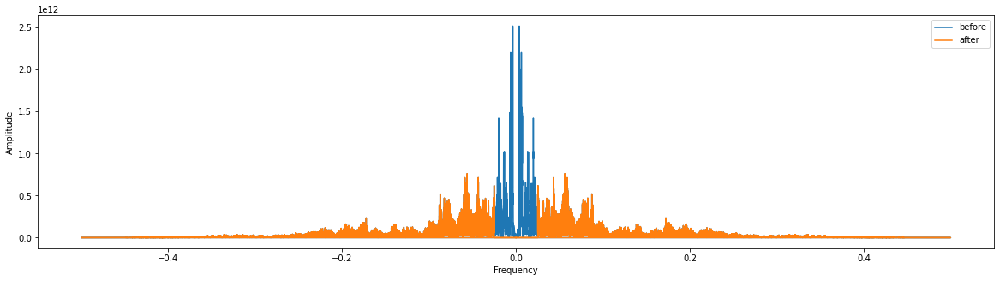

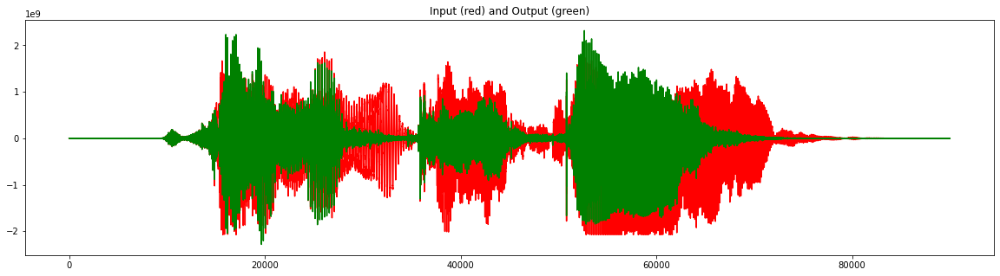

In [11]:
# begin_test
filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering = highpass_fft_filter_audio(
    input_audio)
plot_fftfreq(frequencies, amplitude_before_filtering,
             amplitude_after_filtering)
plot_waveform(input_audio, filtered_audio)
# end_test


In [317]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)


Original audio


In [322]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)


Filtered audio


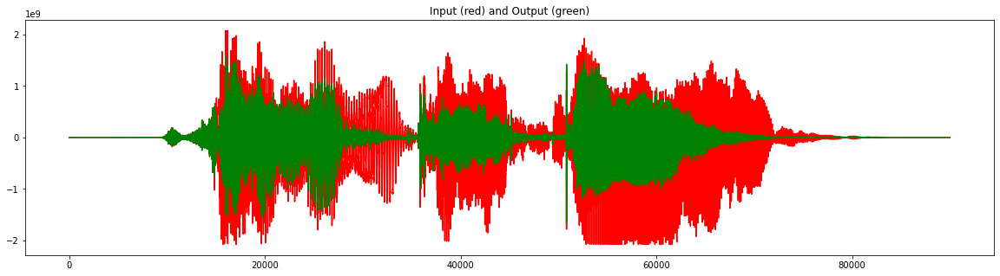

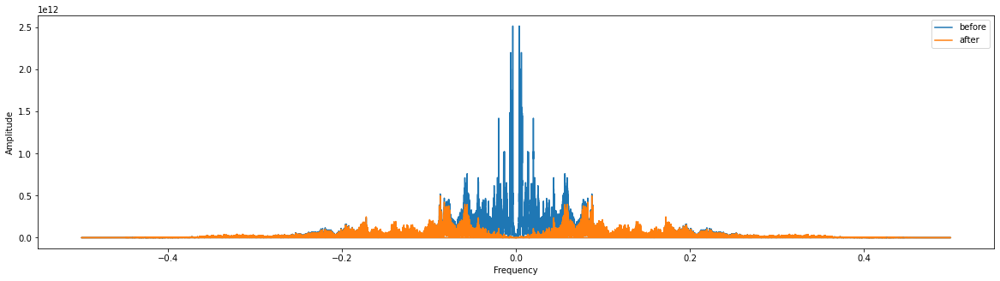

In [333]:
# begin_test
filtered_audio = highpass_normal_filter_audio(input_audio)
plot_waveform(input_audio, filtered_audio)

# plotting fft representation of the filtered signal
_, frequencies_normal, amplitude_before_filtering_normal, _ = highpass_fft_filter_audio(
    filtered_audio)
plot_fftfreq(frequencies_normal, amplitude_before_filtering,
             amplitude_before_filtering_normal)
# end_test


In [15]:
# begin_test
# end_test


In [324]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)


Original audio


In [325]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)


Filtered audio


Discuss which version is better when and why? 

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_:

When more noise is concentrated in the low-frequency region, highpass fft filter may be better, because it filters out all values in the low-frequency domain. When there is noise in various frequency regions of the entire audio, normal filter can perform better, because it can reduce the noise of the entire audio.

**Question 1.b**
<a name='question1b'></a>

Implement a filter to find vertical edges in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [18]:
def detect_vertical_edges(image):
    # solution
    # Define kernel
    kernel = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
    kernel_height = kernel.shape[0]
    kernel_width = kernel.shape[1]
    # Padding:1    Stride: 1
    img_height = image.shape[0]
    img_width = image.shape[1]
    pad_img = np.zeros((img_height+2, img_width+2, 3))
    pad_img[..., 0] = np.pad(image[..., 0], pad_width=1)
    pad_img[..., 1] = np.pad(image[..., 1], pad_width=1)
    pad_img[..., 2] = np.pad(image[..., 2], pad_width=1)
    # Change the original image
    i0=np.repeat(np.arange(kernel_height), kernel_height)
    i1=np.repeat(np.arange(img_height), img_height)
    i = i0.reshape(-1, 1) + i1.reshape(1, -1)
    j0 = np.tile(np.arange(kernel_width), kernel_height)
    j1 = np.tile(np.arange(img_height), img_width)
    j = j0.reshape(-1, 1) + j1.reshape(1, -1)

    # Convolution RGB respectively
    filtered_image = np.zeros((img_height, img_width, 3))
    conv_img_R, conv_img_G, conv_img_B = pad_img[i, j, 0], pad_img[i, j, 1], pad_img[i, j, 2]

    kernel_flatten = kernel.reshape(-1)
    filtered_image[..., 0] = (kernel_flatten.dot(conv_img_R)).reshape(img_height, img_width)
    filtered_image[..., 1] = (kernel_flatten.dot(conv_img_G)).reshape(img_height, img_width)
    filtered_image[..., 2] = (kernel_flatten.dot(conv_img_B)).reshape(img_height, img_width)
    filtered_image = filtered_image.sum(axis=-1)
    # end_solution

    return filtered_image


In [19]:
input_image_filename = "./Datasets/Filtering/image.png"

Run filter over the input image

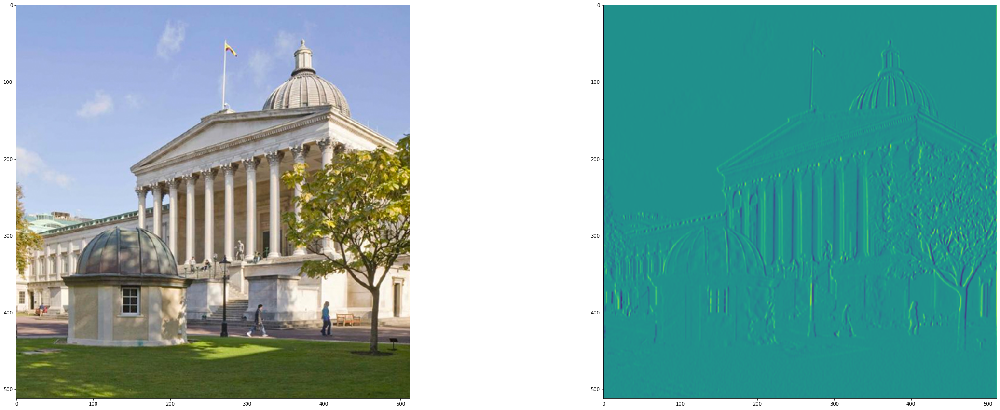

In [20]:
# begin_test
input_image = np.asarray(PIL.Image.open(input_image_filename).convert('RGB'))
filtered_image = detect_vertical_edges(input_image)
plot_images_horizontal([input_image, filtered_image])
# end_test


In [21]:
# begin_test
# end_test


**Question 1.c**
<a name='question1c'></a>

Modify the input image such that it is visually different from the original but has the same output when you perform edge detection. Ideal value for L1_loss between filtered_image and filtered_modified_image is 0.0, but your modification can/should try to minimize this distance as much as possible.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [22]:
def modify_image(input_image):
    # solution
    input_modified = input_image.copy()
    input_modified[..., 0] = input_image[..., 2]
    input_modified[..., 2] = input_image[..., 0]
    # end_solution

    return input_modified


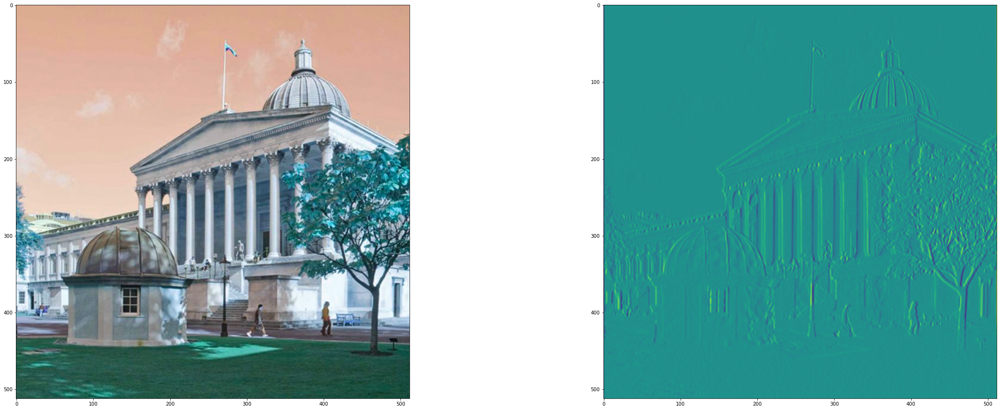

L1 distance between original and modified image: 84.99381510416667
L1 distance between filtered and modified filtered image: 0.0


In [23]:
# begin_test
input_modified = modify_image(input_image)
filtered_modified_image = detect_vertical_edges(input_modified)
plot_images_horizontal([input_modified, filtered_modified_image])
print(
    f"L1 distance between original and modified image: {l1_loss(input_image, input_modified)}")
print(
    f"L1 distance between filtered and modified filtered image: {l1_loss(filtered_image, filtered_modified_image)}")
# end_test


In [24]:
# begin_test
# end_test


## 2. Denoising (35 points)
<a name='question2'></a>

[a)](#question2a) Implement `denoiseGauss(image)` to denoise the image noisy `image.png` under `Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question2b) Implement a pyramidal encoder-decoder to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `Datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The encoder and decoder must have at least 3 layers each. Please use ReLU non-linearities after each layer (**15 points**).
Please train for no more than 400 epochs.

[c)](#question2c) Given the comparison between the Gaussian-kernel denoising and encoder-decoder denoising
methods, discuss which method performs better and where. You should write no more than half a page. (**5 points**)

[d)](#question2d) Modify the first noisy image from the training set such that it follows the distribution of the domain data (i.e. looks like the noisy images from the training set), but when passed through the trained AE denoiser, yields poor PSNR which is comparable to the gaussian denoiser's performance (**8 points**). Explain your approach in brief (**2 points**). Write no more than 8 sentences.

(Reference example: Given a random noisy image X sampled from our dataset the PSNR value of the output of the trained denoising network on X was 22db we were able to estimate an adverserial example X_adv whose MSE with X is 0.0023 and 0.0043 for two different runs, the outputs of denoising X_adv with the same network have a PSNR of 16.69db and 14.91db respectively.)


**Question 2.a**
<a name='question2a'></a>

Implement the function to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [334]:
def gkern(l=5, sig=1.):

    # solution
    out_kernel = np.zeros((l, l))
    for i in range(l):
        for j in range(l):
            out_kernel[i, j] = np.exp(-0.5*((i - 2)**2 + (j - 2)**2) /
                                      (sig ** 2)) / (2 * np.pi * (sig**2))
    # end_solution

    return out_kernel


def denoise_gauss(image):

    # solution
    gaussian_kernel = gkern()
    kernel_height, kernel_width = gaussian_kernel.shape
    gaussian_kernel = gaussian_kernel.reshape(-1)

    # Padding:2    Stride: 1
    stride = 1
    img_height, img_width, img_chns = image.shape

    processed_img = np.zeros((img_height, img_width, 3))
    processed_img[..., :] = image # if image channels == 1, broadcast to 3

    # Padding size
    p = int(((img_height - 1) * stride - img_height +
            kernel_height) * 0.5)  
    pad_img = np.zeros((img_height + 4, img_width + 4, 3))
    pad_img[..., 0], pad_img[..., 1], pad_img[..., 2] = np.pad(processed_img[..., 0], pad_width=p), np.pad(processed_img[..., 1], pad_width=p), np.pad(processed_img[..., 2], pad_width=p)
    
    # Change the original image
    i0 = np.repeat(np.arange(kernel_height), kernel_height)
    i1 = np.repeat(np.arange(img_height), img_height)
    i = i0.reshape(-1, 1) + i1.reshape(1, -1)
    j0 = np.tile(np.arange(kernel_width), kernel_height)
    j1 = np.tile(np.arange(img_height), img_width)
    j = j0.reshape(-1, 1) + j1.reshape(1, -1)

    
    # Convolution RGB respectively
    denoised_image = np.zeros((img_height, img_width, 3))
    conv_img_R, conv_img_G, conv_img_B = pad_img[i, j, 0], pad_img[i, j, 1], pad_img[i, j, 2]
    denoised_image[..., 0] = (gaussian_kernel.dot(
    conv_img_R)).reshape(img_height, img_width) 
    denoised_image[..., 1] = (gaussian_kernel.dot(
    conv_img_G)).reshape(img_height, img_width) 
    denoised_image[..., 2] = (gaussian_kernel.dot(
    conv_img_B)).reshape(img_height, img_width)
    
    denoised_image[..., :] /= denoised_image[..., :].max()
    denoised_image = denoised_image.astype(np.float32)
    if img_chns == 1:
        denoised_image = denoised_image[:, :, 0]
    # end_solution

    return denoised_image


Load input image from file

In [27]:
noisy_image_filename = "./Datasets/Filtering/noisy_image.png"

Filter the input image

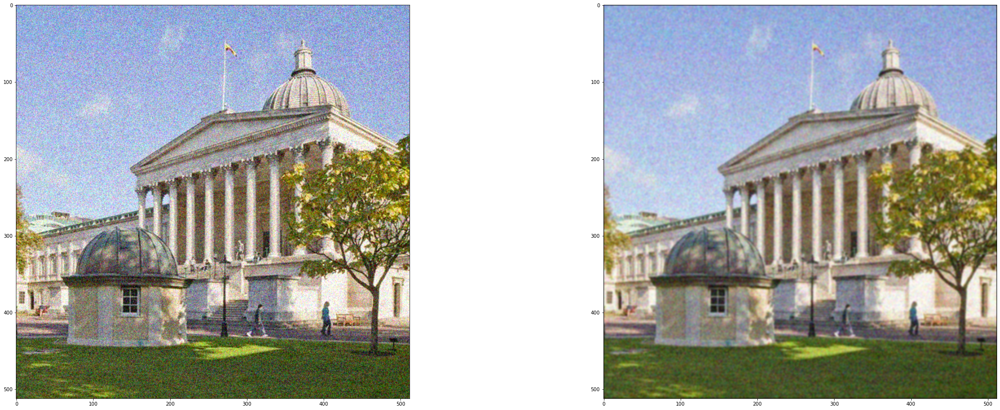

In [28]:
noisy_image = np.asarray(PIL.Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 2.b**
<a name='question2b'></a>

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [29]:
class DenoisingDB(Dataset):

    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()

        # solution
        noisy_data_name = os.listdir(input_imgs_path)
        ground_truth_name = os.listdir(cleaned_imgs_path)
        self.noisy_data = []
        self.ground_truth = []
        # Load images
        for i in range(len(noisy_data_name)):
            img = np.asarray(PIL.Image.open(
                str(input_imgs_path)+'/' + noisy_data_name[i]).convert('RGB'))
            self.noisy_data.append(img)
            
            target_img = np.asarray(PIL.Image.open(
                str(cleaned_imgs_path)+'/' + ground_truth_name[i]).convert('RGB'))
            self.ground_truth.append(target_img)

        # end_solution

    def __len__(self):

        # solution
        length = len(self.noisy_data)
        # end_solution

        return length

    def __getitem__(self, idx):

        # solution
        # Crop the image into (128, 128, 1) dimensions
        input_image = self.noisy_data[idx][:128, :128, :]
        target_image = self.ground_truth[idx][:128, :128, :]
        # Only have one channel
        input_image = torch.tensor(input_image[..., 0]).reshape((1, 128, 128)) / 255.
        target_image = torch.tensor(target_image[..., 0]).reshape((1, 128, 128)) / 255.
        # end_solution

        return (input_image, target_image)


Implement the Encoder network:

Note that the `Encoder` and `Decoder` networks need to be sufficiently large for performing the denoising task successfully. We suggest 5 levels and double the number of internal feature-maps when reducing the spatial resolution with use of ReLU non-linearities. But feel free experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [238]:
class Encoder(Module):

    def __init__(self):
        super(Encoder, self).__init__()

        # solution
        self.pool = nn.MaxPool2d(2) 

        self.enc_layers = nn.ModuleList()

        chs = [1, 4, 8, 16, 32, 64] # channel size

        for i in range(1, len(chs)):
            enc_layer_item = nn.Sequential(
                nn.Conv2d(chs[i-1], chs[i], kernel_size=3, padding='same'),
                nn.ReLU(),
                nn.BatchNorm2d(chs[i]),

                nn.Conv2d(chs[i], chs[i], kernel_size=3, padding='same'),
                nn.ReLU(),
                nn.BatchNorm2d(chs[i]),
            ).to(device)
            
            self.enc_layers.append(enc_layer_item)
        # end_solution

    def forward(self, high_res_image):
        # solution
        low_res_image = []
        low_res_image.append(high_res_image)
        
        chs = [1, 4, 8, 16, 32, 64]
        img_size = [128, 128, 64, 32, 16, 8]
        for i in range(len(chs)-1):
            if i == 0:
                img = self.enc_layers[i](low_res_image[0])
            else:
                img = self.pool(low_res_image[i])
                img = self.enc_layers[i](img)
            low_res_image.append(img)
        # end_solution

        return low_res_image


Implement the Decoder network:

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [239]:
class Decoder(Module):

    def __init__(self):
        super(Decoder, self).__init__()

        # solution
        self.up_conv = nn.ModuleList()
        self.dec_layer = nn.ModuleList()

        chs = [64, 32, 16, 8, 4, 1] # channel size

        for i in range(len(chs) - 2):
            up_conv_item = nn.ConvTranspose2d(chs[i], chs[i+1], 2, 2).to(device)
            self.up_conv.append(up_conv_item)

            dec_layer_item = nn.Sequential(
                nn.Conv2d(chs[i], chs[i+1], kernel_size=3, padding='same'),
                nn.ReLU(),
                nn.BatchNorm2d(chs[i+1]),
                nn.Conv2d(chs[i+1], chs[i+1], kernel_size=3, padding='same'),
                nn.ReLU(),
                nn.BatchNorm2d(chs[i+1]),
            ).to(device)
            self.dec_layer.append(dec_layer_item)
            
        self.compress_conv = nn.Sequential(
            nn.Conv2d(4, 1, kernel_size=3, padding='same'),
            nn.BatchNorm2d(1),
            nn.Sigmoid(),
        )

        # end_solution

    def forward(self, low_res_image):

        # solution
        # Refer to U-net 
        low_res_image = low_res_image[::-1]
        high_res_image = []
        high_res_image.append(low_res_image[0])

        for i in range(len(low_res_image)-2):

            img = self.up_conv[i](high_res_image[i])
            # Crop the image to the same size as last image
            _, _, H, W = img.size() 
            enc_ftrs = torchvision.transforms.CenterCrop([H, W])(low_res_image[i+1])
            # Skip-connection
            x = torch.cat([img, enc_ftrs], dim=1)
            x = self.dec_layer[i](x)
            high_res_image.append(x)
       
        denoised_image = self.compress_conv(high_res_image[-1])
        # end_solution

        return denoised_image


Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [32]:
def loss_function(prediction, target):

    # solution
    loss_func = nn.MSELoss()
    loss = loss_func(prediction, target)
    # end_solution

    return loss


Paths to input data

In [33]:
input_imgs_path = Path("./Datasets/Denoising/input_noisy_images")
cleaned_imgs_path = Path("./Datasets/Denoising/target_clean_images")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [240]:
docs_dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)

encoder = Encoder().to(device)
decoder = Decoder().to(device)

# solution

# Mini-batch
BATCH_SIZE = 4
EPOCHS = 200
LR = 0.01 
trainloader = DataLoader(docs_dataset, batch_size=BATCH_SIZE,
                                          shuffle=True, num_workers=0)
optimizer = optim.Adam([
    {'params':encoder.parameters(), 'lr':LR,},
    {'params':decoder.parameters(), 'lr':LR,},
    ])
loss_func = nn.MSELoss()
outputs = []
train_num = 0
pbar = tqdm(total=EPOCHS)
# training process
for epoch in range(EPOCHS):
    train_loss_epoch = 0
    pbar.update(1)
    for step, (x_train, y_train) in enumerate(trainloader):
        x_train = x_train.to(device).float()
        y_train = y_train.to(device).float()
        encoder.train()
        decoder.train()

        low_res_image = encoder.forward(x_train)
        output = decoder.forward(low_res_image)

        loss = loss_function(output, y_train)
        # zero the parameter gradients
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()


        train_loss_epoch += loss.item() * x_train.size(0)
        train_num += x_train.size(0)
        
    train_loss = train_loss_epoch / train_num
    pbar.set_postfix(loss=train_loss)
    # print('epoch:', epoch, 'train loss:', train_loss)
pbar.close()
# end_solution


  0%|          | 0/200 [00:00<?, ?it/s]

Save the model (needed for marking)

In [248]:
torch.save({"encoder": encoder, "decoder": decoder}, "models/ex2b.pth")

In [249]:
state_dict = torch.load("models/ex2b.pth")
encoder = state_dict["encoder"].to(device)
decoder = state_dict["decoder"].to(device)

Load trained model

Plot 5 input images and their relative denoised images side by side.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

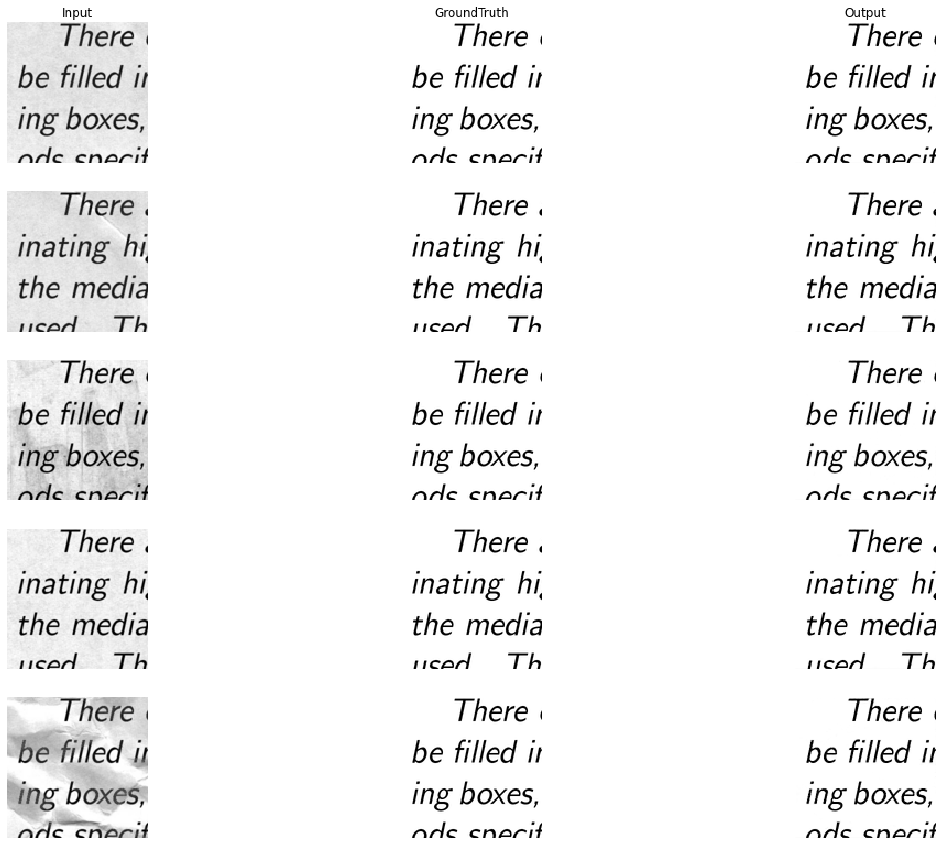

In [246]:
input_imgs, gt_imgs, output_imgs = [], [], []

# solution
val_loss_epoch, val_num = 0, 0
BATCH_SIZE = 4
testloader = DataLoader(docs_dataset, batch_size=BATCH_SIZE,
                                          shuffle=False, num_workers=0)
outputs = []
for step, (x_test, y_test) in enumerate(testloader):
    if step < 5:
        x_test = x_test.to(device)
        y_test = y_test.to(device)
        encoder.eval()
        decoder.eval()
        low_res_image = encoder.forward(x_test)
        output = decoder.forward(low_res_image)
        outputs.append(output)
        loss = loss_function(output, y_test)

        val_loss_epoch += loss.item() * x_test.size(0)
        val_num += x_test.size(0)
    else:
        break
val_loss = val_loss_epoch / val_num


for i in range(5):
    im = docs_dataset[i][0].cpu().squeeze().detach().numpy()
    input_imgs.append(im)
    gt = docs_dataset[i][1].cpu().squeeze().detach().numpy()
    gt_imgs.append(gt)

    # Each batch has 4 images
    if i == 4:
        denoised_img = outputs[1][0].cpu().squeeze().detach().numpy()
    else:
        denoised_img = outputs[0][i].cpu().squeeze().detach().numpy()
    
    output_imgs.append(denoised_img)
    
# end_solution

titles = ['Input', 'GroundTruth', 'Output']
plot_images([input_imgs, gt_imgs, output_imgs], titles, None)


**Question 2.c**
<a name='question2c'></a>

Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [251]:
dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)

images = [docs_dataset[i][0].to(device) for i in range(5)]
targets = [docs_dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

# your solution should populate the `images_ae` and `images_gauss` lists with the required 5 image outputs
# solution

stack_images = torch.stack(images, 0)
ae = decoder(encoder(stack_images))

for i in range(5):
    # Auto-encoder output
    ae_np = ae[i].squeeze().cpu().detach().numpy()
    images_ae.append(ae_np) 

    # Gaussian filter
    gs_images = stack_images[i].cpu().detach().numpy().reshape(128, 128, 1)
    gs_res = denoise_gauss(gs_images) 
    images_gauss.append(gs_res)

# end_solution


# Plot images and PSNR

In [243]:
imgs_plot = [el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [el.detach().squeeze().cpu().numpy() for el in targets]

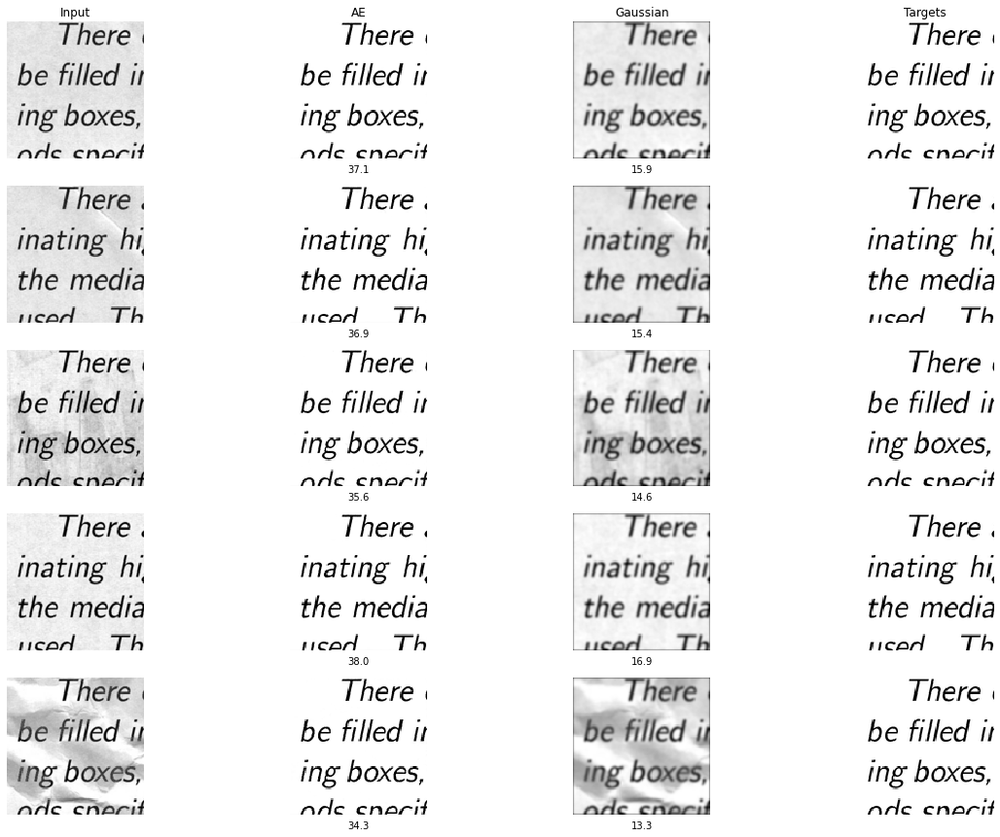

In [252]:
psnrs = [el for el in targets]
for i in range(len(tgts_plot)):
    psnr_ae = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images(img, titles, texts)
plt.show()


Discuss which method performs better:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_: Gaussian-kernel denoising and encoder-decoder have different working principles.

A Gaussian filter performs better at reducing a large amount of high frequency noise in images. Gaussian-kernel denoising can blur the image by convolving images with a Gaussian kernel and it will output a weighted average of each pixel's neighbours. Due to its property of frequency response, it can be used as a low-pass frequency filter.

Compared to Gaussian-kernel denosing, the encoder extracts main feartures of input images and the decoder can reconstruct images by using these features. So encoder-decoder can actively learn the main features of images which makes it suitable for most situations of image denoising.

When the noise is irregular or has a large difference from the original target image, encoder-decoder can complete the denoising well, but the Gaussian filter can only blur the image without removing these noise from the original images.

**Question 2.d**
<a name='question2d'></a>

Use the cell below to modify the `adversarial_image` variable: 

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [40]:
adversarial_image = torch.stack(images, dim=0).to(device)[-1:]
adversarial_target = torch.stack(targets, dim=0).to(device)[-1:]

# Your solution should update (modify) the `adversarial_image` variable above.
# After modification, it should still be torch.Tensor of shape [1 x 1 x 128 x 128]
# solution
epsilon = 0.1
img = torch.clone(adversarial_image)
img = img.to(device)
adversarial_target = adversarial_target.to(device)
img.requires_grad = True

encoder.eval()
decoder.eval()
output = decoder(encoder(img))

loss = loss_function(output, adversarial_target)
optimizer.zero_grad()
loss.backward()
optimizer.step()
sign_data_grad = img.grad.sign()
adversarial_image = img + epsilon * sign_data_grad
adversarial_image = torch.clamp(adversarial_image, 0, 1).detach()
# end_solution


Compute the performance of the `adversarial` image on AE denoiser and Gaussian-kernel denoiser

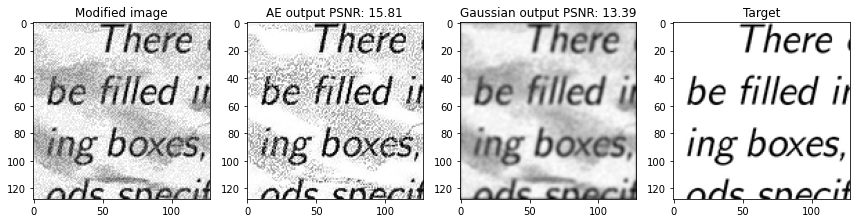

MSE between original and adversarial image:  tensor(0.0085, device='cuda:0')


In [234]:
original_image = torch.stack(images, dim=0).to(device)[-1:]
ae_prediction = decoder(encoder(adversarial_image))
ae_out = ae_prediction.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy()

image_np = adversarial_image.squeeze().cpu().numpy()
image_np = np.tile(image_np[:, :, None], (1, 1, 3))
gauss_out = denoise_gauss(image_np)[:, :, 0]

adv_img = adversarial_image[0].permute(1, 2, 0).cpu().numpy()
target = adversarial_target[0].permute(1, 2, 0).cpu().numpy()

psnr_ae = peak_signal_noise_ratio(
    adversarial_target[0, 0].cpu().numpy(), ae_out)
psnr_gauss = peak_signal_noise_ratio(
    adversarial_target[0, 0].cpu().numpy(), gauss_out)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 4))
ax1.set_title("Modified image")
ax1.imshow(adv_img, cmap="gray")
ax2.set_title(f"AE output PSNR: {psnr_ae :.2f}")
ax2.imshow(ae_out, cmap="gray")
ax3.set_title(f"Gaussian output PSNR: {psnr_gauss :.2f}")
ax3.imshow(gauss_out, cmap="gray")
ax4.set_title("Target")
ax4.imshow(target, cmap="gray")

plt.tight_layout()
plt.show()
print('MSE between original and adversarial image: ',
      ((original_image-adversarial_image)**2).mean())


Explain your approach below:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_: I choose to use Fast Gradient Sign Method (FGSM) to generate adversial examples.

Firstly, we feed the original image into our model and get the output. 

Then calculating the **loss** between the output and ground truth so that we can obtain the **sign of gradient** of loss with respect to the input image.

 Finally, we multiply this sign by a random decimal $epsilon$ and add it to the original image to get the final result.

## 3. Auto-encoder and Variational Auto-encoder (45 points)
<a name='question3'></a>

[a)](#question3a) Implement a convolutional auto-encoder (AE). You can make use of convolution, pooling, batchnorm layers (feel free to use any differentiable operations that `PyTorch` provides). Implement Dataset classes for loading the MNIST and CelebA-HQ dataset. And implement the loss function. The loss between input and output should be **L2**. (**15 points**) $$||I −dec(enc(I))||^2_2$$

[b)](#question3b) Train your defined AE on MNIST dataset. Please train for no more than 100 epochs. (**5 points**)
Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[c)](#question3c) Train your defined AE on CelebAHQ dataset. Please train for no more than 400 epochs. (**5 points**) Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[d)](#question3d) Implement a Variataional Auto-Encoder (VAE) and train it on CelebA-HQ. Implement the VAE ELBO (Evidence Lower Bound) loss. Show 10 random images sampled from the VAE you trained. (**10 points**)
Please train it for no longer than 400 epochs.

[e)](#question3e) i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ dataset (**1 point**). ii. Compare the generative performance of AE v/s VAE by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. Note: You need to do independent research and implement a mechanism to sample from the bottleneck space of the AE reasonably 🤔. (**4 points**).

[f)](#question3f) Discuss your design choices for Q3a and Q3d (i.e. AE and VAE). Are the models different? Why? Discuss in no more than 10 sentences. If needed add plots and a demo. (**5 points**)

**Question 3.a**
<a name='question3a'></a>

Implement a convolutional auto-encoder

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [5]:
class AutoEncoder(Module):

    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size

        # solution

        # Encoder models
        self.pool = nn.MaxPool2d(2) 
        self.enc_layers = nn.ModuleList()

        self.enc_img_size = [32, 16, 8]
        self.chs_enc = [channel_size, 32, 64]
        
        for i in range(1, len(self.chs_enc)):
            enc_layer_item = nn.Sequential(
                nn.Conv2d(self.chs_enc[i-1], self.chs_enc[i], kernel_size=3, padding='same'),
                nn.MaxPool2d(2),
                nn.BatchNorm2d(self.chs_enc[i]),
                nn.LeakyReLU(),

                nn.Conv2d(self.chs_enc[i], self.chs_enc[i], kernel_size=3, padding='same'),
                nn.BatchNorm2d(self.chs_enc[i]),
                nn.LeakyReLU(),
            ).to(device)
            self.enc_layers.append(enc_layer_item)
      
        # Fully connection layer
        self.enc_fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.chs_enc[-1] * self.enc_img_size[-1] * self.enc_img_size[-1], self.bottleneck_size),
            nn.BatchNorm1d(self.bottleneck_size),
            nn.LeakyReLU(),
        )

        # Decoder models
        self.dec_img_size = self.enc_img_size[::-1]
        self.chs_dec = self.chs_enc[::-1]
        self.dec_fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.bottleneck_size, self.dec_img_size[0] * self.dec_img_size[0] * self.chs_dec[0]),
            nn.BatchNorm1d(self.dec_img_size[0] * self.dec_img_size[0] * self.chs_dec[0]),
            nn.LeakyReLU(),
            nn.Unflatten(1, (self.chs_dec[0], self.dec_img_size[0], self.dec_img_size[0])),
        )
        
        self.up_conv = nn.ModuleList()
        for i in range(len(self.chs_dec) - 1):
            up_conv_item = nn.Sequential(
                nn.ConvTranspose2d(self.chs_dec[i], self.chs_dec[i+1], 2, 2),
                nn.BatchNorm2d(self.chs_dec[i+1]),
                nn.LeakyReLU(),
            )
            self.up_conv.append(up_conv_item)
            
        self.compress_conv = nn.Sequential(
            nn.Conv2d(1, 1, kernel_size=3, padding='same'),
            nn.BatchNorm2d(1),
            nn.Sigmoid(),
        )
        # end_solution

    def encoder(self, image):

        # solution
        code = image
        for i in range(len(self.chs_enc)-1):
            code = self.enc_layers[i](code)
        code = self.enc_fc(code)
        # end_solution

        return code

    def decoder(self, code):

        # solution
        decoded_image = self.dec_fc(code)
        for i in range(len(self.chs_dec) - 1):
            decoded_image = self.up_conv[i](decoded_image)
        decoded_image = self.compress_conv(decoded_image)
        # end_solution

        return decoded_image

    def forward(self, image):

        # solution
        code = self.encoder(image)
        decoded_image = self.decoder(code)
        # end_solution

        return decoded_image


In [ ]:
# begin_test

# end_test


**Question 3.b**
<a name='question3b'></a>

Implement the dataset class to load MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [6]:
class MNIST(Dataset):

    def __init__(self, dataset_path):
        # solution
        data_name = os.listdir(dataset_path)
        # Load images
        self.data = []
        for i in range(len(data_name)):
            img = np.asarray(PIL.Image.open(
                str(dataset_path)+'/' + data_name[i]).convert('RGB'))
            self.data.append(img)
        # end_solution

    def __len__(self):
        # solution
        length = len(self.data)
        # end_solution

        return length

    def __getitem__(self, idx):
        # solution
        image = self.data[idx]
        resized_img = cv2.resize(image, [32, 32])
        # only have one channel
        image = torch.tensor(resized_img[..., 0]).reshape((1, 32, 32)) / 255.
        # end_solution

        return image


Implement the dataset class to load CelebAHQ dataset. Feel free to resize the images to a lower resolution depending on your access to compute. Do not resize to a resolution of lower than [32 x 32].

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [7]:
class CelebAHQ(Dataset):

    def __init__(self, dataset_path):
        # solution
        data_name = os.listdir(dataset_path)
        # Load images
        self.data = []
        for i in range(len(data_name)):
            img = np.asarray(PIL.Image.open(
                str(dataset_path)+'/' + data_name[i]).convert('RGB'))
            self.data.append(img)
        # end_solution

    def __len__(self):
        # solution
        length = len(self.data)
        # end_solution

        return length

    def __getitem__(self, idx):
        # solution
        image = self.data[idx]
        resized_img = cv2.resize(image, [32, 32])
        image = torch.tensor(resized_img).reshape((3, 32, 32)) / 255.
        
        # end_solution

        return image


Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [8]:
def reconstruction_loss(prediction, target):

    # solution
    recon_loss_func = nn.MSELoss()
    recon_loss = recon_loss_func(prediction, target)
    # end_solution

    return recon_loss


Create MNIST dataloaders for training and validation

In [48]:
mnist_train_data_path = Path("./Datasets/MNIST/train/")
mnist_train_dataset = MNIST(mnist_train_data_path)

mnist_validation_data_path = Path("./Datasets/MNIST/val/")
mnist_validation_dataset = MNIST(mnist_validation_data_path)


Create CelebA-HQ dataloaders for training and validation

In [ ]:
celeba_hq_train_data_path = "../Datasets_v2/Datasets/celeba_hq_32/train"
celeba_hq_train_dataset = CelebAHQ(celeba_hq_train_data_path)

celeba_hq_validation_data_path = "../Datasets_v2/Datasets/celeba_hq_32/val"
celeba_hq_validation_dataset = CelebAHQ(celeba_hq_validation_data_path)


Train the AE on MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [254]:
mnist_autoencoder = None  # your model (re-assign below in solution part)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_mnist = DataLoader(
    mnist_train_dataset, shuffle=True, batch_size=128, num_workers=0)
torch_validation_mnist = DataLoader(
    mnist_validation_dataset, shuffle=True, batch_size=128, num_workers=0)
mnist_optimizer = None  # your optimizer (re-assign below in solution part)

# utility that you can optionally use to view losses live during training
liveloss = PlotLosses()

# solution
mnist_autoencoder = AutoEncoder(256).to(device)
MNIST_LR = 0.01
EPOCHS = 20
mnist_optimizer = optim.Adam(mnist_autoencoder.parameters(), MNIST_LR)
pbar = tqdm(total=EPOCHS)

for epoch in range(EPOCHS):
    train_loss_epoch, val_loss_epoch = 0, 0
    train_num, val_num = 0, 0
    logs = {}
    pbar.update(1) # update the process bar
    for step, x_train in enumerate(torch_train_mnist, 0):
        x_train = x_train.to(device)
        mnist_autoencoder.train()
        output = mnist_autoencoder(x_train)
        
        loss = reconstruction_loss(output, x_train)
        mnist_optimizer.zero_grad()
        loss.backward()
        mnist_optimizer.step()

        train_loss_epoch += loss.item() * x_train.size(0)
        train_num += x_train.size(0)

    for step, x_val in enumerate(torch_validation_mnist, 0):
        x_val = x_val.to(device)
        mnist_autoencoder.eval()
        output = mnist_autoencoder(x_val)
        loss = reconstruction_loss(output, x_val)

        val_loss_epoch += loss.item() * x_val.size(0)
        val_num += x_val.size(0)

    train_loss = train_loss_epoch / train_num
    val_loss = val_loss_epoch / val_num
    logs['loss_train'] = train_loss
    logs['loss_val'] = val_loss
    
    pbar.set_postfix(loss= train_loss)
    # liveloss.update(logs)
    # liveloss.send()
    # print('epoch:', epoch, 'train loss:', train_loss, 'val_loss:', val_loss)
pbar.close()
# end_solution


  0%|          | 0/20 [00:00<?, ?it/s]

Save trained model (needed for marking)

In [256]:
torch.save(mnist_autoencoder, "models/ex3b.pth")


Load trained model

In [257]:
mnist_autoencoder = torch.load("models/ex3b.pth")


Showing, for 5 samples in the validation set, the input and the AE reconstruction, side-by-side.

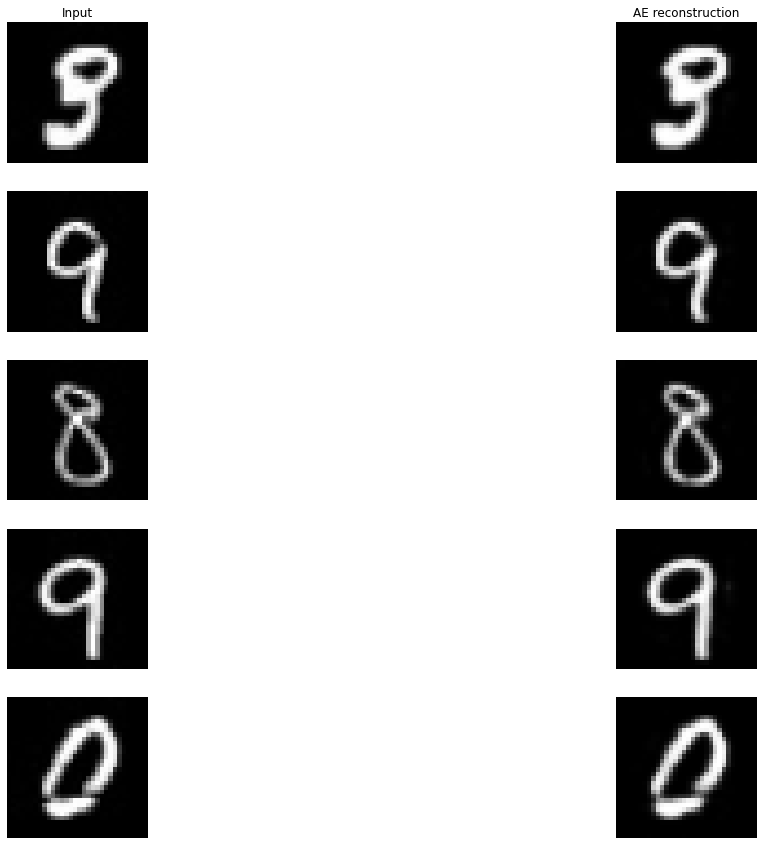

In [258]:
indices = np.random.choice(
    range(len(mnist_validation_dataset)), 5, replace=False)
mnist_random_images = [mnist_validation_dataset[idx] for idx in indices]
batch = torch.stack(mnist_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
mnist_autoencoder.eval()
pred_img = mnist_autoencoder(gt_img)

# plot the images: 
imgs_plot = [el.cpu().squeeze().numpy() for el in gt_img]
pred_plot = [el.cpu().detach().squeeze().numpy() for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()


**Question 3.c**
<a name='question4a'></a>

Feel free to use the cell below to redefine (copy + edit) the AutoEncoder class if you are changing the architecture of your AutoEncoder Model for CelebA-HQ dataset.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [265]:
# solution
class AutoEncoder(Module):

    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size

        # solution
        # Encoder models
        self.pool = nn.MaxPool2d(2) 
        self.enc_layers = nn.ModuleList()

        self.enc_img_size = [32, 16] # image size
        self.chs_enc = [channel_size, 128] # channels

        for i in range(1, len(self.chs_enc)):
            enc_layer_item = nn.Sequential(
                nn.Conv2d(self.chs_enc[i-1], self.chs_enc[i], kernel_size=3, padding='same'),
                nn.MaxPool2d(2),
                nn.BatchNorm2d(self.chs_enc[i]),
                nn.LeakyReLU(),

                nn.Conv2d(self.chs_enc[i], self.chs_enc[i], kernel_size=3, padding='same'),
                nn.BatchNorm2d(self.chs_enc[i]),
                nn.LeakyReLU(),
            ).to(device)
            self.enc_layers.append(enc_layer_item)
       
        self.enc_fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.chs_enc[-1] * self.enc_img_size[-1] * self.enc_img_size[-1], self.bottleneck_size),
        )


        # Decoder models
        self.dec_img_size = self.enc_img_size[::-1] # image size
        self.chs_dec = self.chs_enc[::-1] # channels

        self.dec_fc = nn.Sequential(
            nn.Linear(self.bottleneck_size, self.dec_img_size[0] * self.dec_img_size[0] * self.chs_dec[0]),
            nn.Unflatten(1, [self.chs_dec[0], self.dec_img_size[0], self.dec_img_size[0]])
        )

        self.up_conv = nn.ModuleList()
        for i in range(len(self.chs_dec) - 1):
            up_conv_item = nn.Sequential(
                nn.ConvTranspose2d(self.chs_dec[i], self.chs_dec[i+1], 2, 2),
                nn.BatchNorm2d(self.chs_dec[i+1]),
                nn.LeakyReLU(),
            )
            self.up_conv.append(up_conv_item)
    
        self.compress_conv = nn.Sequential(
            nn.Conv2d(3, 3, 1, padding='same'),
            nn.BatchNorm2d(3),
            nn.Sigmoid(),
        )
        # end_solution

    def encoder(self, image):

        # solution
        code = image
        for i in range(len(self.chs_enc)-1):
            code = self.enc_layers[i](code)
        
        code = self.enc_fc(code)
        # end_solution

        return code

    def decoder(self, code):

        # solution
        decoded_imgs = []
        decoded_image = self.dec_fc(code)
        
        for i in range(len(self.chs_dec) - 1):
            decoded_image = self.up_conv[i](decoded_image)
            
        decoded_image = self.compress_conv(decoded_image)
        # end_solution

        return decoded_image

    def forward(self, image):

        # solution
        code = self.encoder(image)
        decoded_image = self.decoder(code)
        # end_solution

        return decoded_image
# end_solution


Train the autoencoder on CelebA-HQ dataset

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [266]:
celeba_hq_autoencoder = None  # your model (assign below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(
    celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=0)
torch_validation_celeba_hq = DataLoader(
    celeba_hq_validation_dataset, shuffle=True, batch_size=128, num_workers=0)
celeba_hq_optimizer = None  # your optimizer (re-assign below in solution part)

# utility that you can optionally use to view losses live during training
liveloss = PlotLosses()

# solution
celeba_hq_autoencoder = AutoEncoder(1028, 3).to(device)
CELEBA_LR = 0.01
EPOCHS = 30
celeba_hq_optimizer = optim.Adam(celeba_hq_autoencoder.parameters(), CELEBA_LR)
pbar = tqdm(total=EPOCHS)

for epoch in range(EPOCHS):
    train_loss_epoch, val_loss_epoch = 0, 0
    train_num, val_num = 0, 0
    logs = {}
    pbar.update(1)
    for step, x_train in enumerate(torch_train_celeba_hq, 0):
        x_train = x_train.to(device)
        celeba_hq_autoencoder.train()

        output = celeba_hq_autoencoder(x_train)
        # 
        loss = reconstruction_loss(output, x_train)
        celeba_hq_optimizer.zero_grad()
        loss.backward()
        celeba_hq_optimizer.step()

        train_loss_epoch += loss.item() * x_train.size(0)
        train_num += x_train.size(0)

    for step, x_val in enumerate(torch_validation_celeba_hq, 0):
        x_val = x_val.to(device)
        celeba_hq_autoencoder.eval()
        output = celeba_hq_autoencoder(x_val)
        loss = reconstruction_loss(output, x_val)
        
        val_loss_epoch += loss.item() * x_val.size(0)
        val_num += x_val.size(0)

    train_loss = train_loss_epoch / train_num
    val_loss = val_loss_epoch / val_num
    # logs['loss_train'] = train_loss
    # logs['loss_val'] = val_loss
    pbar.set_postfix(train_loss=train_loss, val_loss=val_loss)
    # print('epoch:', epoch, 'train_loss:', train_loss, 'val_loss:', val_loss)
pbar.close()
# end_solution


  0%|          | 0/30 [00:00<?, ?it/s]

Save the trained model (Needed for marking)

In [268]:
torch.save(celeba_hq_autoencoder, "models/ex3c.pth")


Load the trained model

In [269]:
celeba_hq_autoencoder = torch.load("models/ex3c.pth")


Showing for 5 samples in the validation set, the input and AE reconstruction, side-by-side.

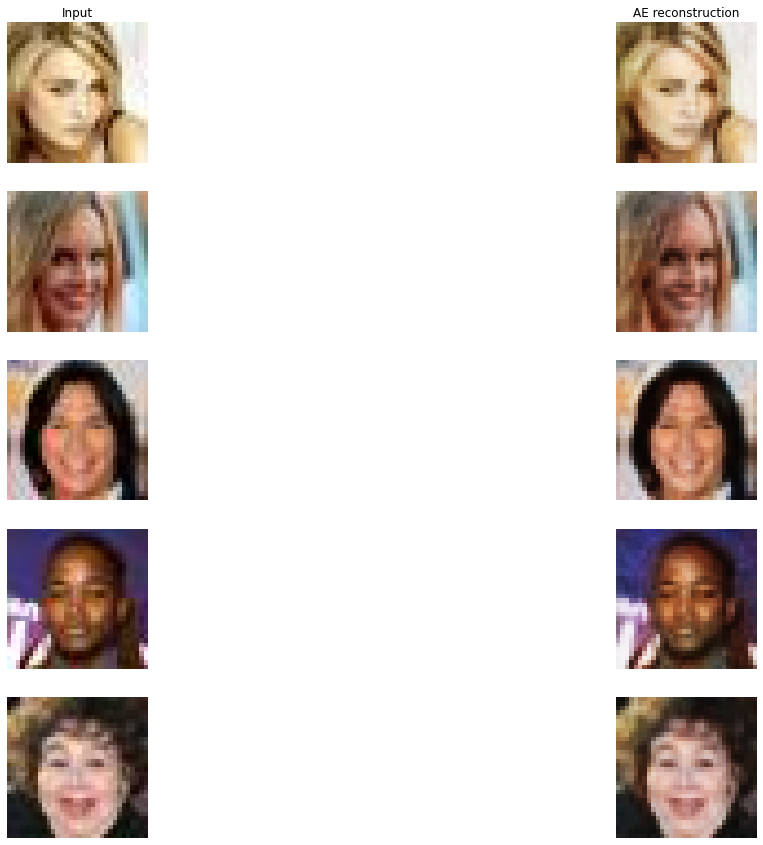

In [270]:
indices = np.random.choice(
    range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_hq_random_images = [
    celeba_hq_validation_dataset[idx] for idx in indices]
batch = torch.stack(celeba_hq_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
celeba_hq_autoencoder.eval()
pred_img = celeba_hq_autoencoder(gt_img)
# plot the images: # 
imgs_plot = [el.cpu().numpy().reshape((32, 32, 3)) for el in gt_img]
pred_plot = [el.cpu().detach().numpy().reshape((32, 32, 3)) for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()


**Question 3.d**
<a name='question3d'></a>

Create the VAE class

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [288]:
class VAE(Module):

    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        self.channel_size = channel_size

        # solution
        self.enc_conv = nn.Sequential(
                nn.Conv2d(3, 32, stride=2, kernel_size=3, padding=1),
                nn.LeakyReLU(),
                nn.BatchNorm2d(32),
                
                nn.Conv2d(32, 64, stride=2, kernel_size=3,  padding=1),
                nn.LeakyReLU(),
                nn.BatchNorm2d(64),
                
                nn.Conv2d(64, 128, stride=2, kernel_size=3, padding=1),
                nn.LeakyReLU(),
                nn.BatchNorm2d(128),
                
                nn.Flatten(),
        )    
        self.enc_fc1 = nn.Linear(128*4*4, self.bottleneck_size)
        self.enc_fc2 = nn.Linear(128*4*4, self.bottleneck_size)
        self.dec_fc = nn.Linear(self.bottleneck_size, 128*4*4)
        self.dec_conv = nn.Sequential(
                nn.Unflatten(1, (128, 4, 4)),
                
                nn.ConvTranspose2d(128, 64, 2, 2),
                nn.LeakyReLU(),
                nn.BatchNorm2d(64),
                
                nn.ConvTranspose2d(64, 32, 2, 2),
                nn.LeakyReLU(),
                nn.BatchNorm2d(32),
                
                nn.ConvTranspose2d(32, 3, 2, 2),
                
                nn.Sigmoid()
                )
        # end_solution

    def encoder(self, image):

        # solution
        code = self.enc_conv(image)
        mu = self.enc_fc2(code)
        log_var = self.enc_fc1(code)
        std = torch.exp(log_var * 0.5)
        
        # end_solution

        return mu, std

    def reparametrization_trick(self, mu, std):

        # solution
        eps = torch.randn_like(std)
        z = (mu + std * eps).to(device)
        # end_solution

        return z

    def decoder(self, code):
        # solution
        decoded_image = self.dec_fc(code)
        decoded_image = self.dec_conv(decoded_image)
        # end_solution

        return decoded_image

    def forward(self, image):

        # solution
        mu, std =self.encoder(image)
        z = self.reparametrization_trick(mu, std)
        decoded_image = self.decoder(z)
        # end_solution

        return decoded_image, mu, std

In [ ]:
# begin_test

# end_test


Implement your vae losses below

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [166]:
def reconstruction_loss(prediction, target):

    # solution
    recon_func = nn.MSELoss()
    recon_loss = recon_func(prediction, target)
    # end_solution

    return recon_loss


def kl_divergence_loss(mu, std):

    # solution
    kl_loss = 0.5 * torch.mean(mu ** 2 + std **2 - 2 * std.log() -1)
    # end_solution

    return kl_loss


Train your VAE

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
celeba_hq_vae = None  # your model (assign it below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(
    celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=0)
torch_validation_celeba_hq = DataLoader(
    celeba_hq_validation_dataset, shuffle=True, batch_size=128, num_workers=0)
# your optimizer (re-assign below in solution part)
celeba_hq_vae_optimizer = None

# utility that you can optionally use to view losses live during training
liveloss = PlotLosses()


# solution
celeba_hq_vae = VAE(1024, 3).to(device)
VAE_LR = 0.001
EPOCHS = 50
celeba_hq_vae_optimizer = optim.Adam(celeba_hq_vae.parameters(), VAE_LR)
pbar = tqdm(total=EPOCHS)
for epoch in range(EPOCHS):
    train_loss_epoch, val_loss_epoch, train_kl_epoch, val_kl_epoch = 0, 0, 0, 0
    train_num, val_num = 0, 0
    logs = {}
    pbar.update(1)
    for step, x_train in enumerate(torch_train_celeba_hq, 0):
        x_train = x_train.to(device)
        celeba_hq_vae.train()
        output, mu, std = celeba_hq_vae(x_train)
        
        rec_loss = reconstruction_loss(output, x_train)
        kl_loss = kl_divergence_loss(mu, std)
        loss = rec_loss + 0.1 * kl_loss

        celeba_hq_vae_optimizer.zero_grad()
        loss.backward()
        celeba_hq_vae_optimizer.step()

        train_loss_epoch += rec_loss.item() * x_train.size(0)
        train_kl_epoch += kl_loss.item() * x_train.size(0)
        train_num += x_train.size(0)

    for step, x_val in enumerate(torch_validation_celeba_hq, 0):
        x_val = x_val.to(device)
        celeba_hq_vae.eval()
        output, mu, std = celeba_hq_vae(x_val)
        
        rec_loss = reconstruction_loss(output, x_val)
        kl_loss = kl_divergence_loss(mu, std)

        val_loss_epoch += rec_loss.item() * x_val.size(0)
        val_kl_epoch += kl_loss.item() * x_val.size(0)
        val_num += x_val.size(0)

    train_loss = train_loss_epoch / train_num
    val_loss = val_loss_epoch / val_num
    kl_loss = train_kl_epoch / train_num
    val_kl_loss = val_kl_epoch / val_num

    logs['loss_train'] = train_loss
    logs['loss_val'] = val_loss
    logs['kl_loss_train'] = kl_loss
    logs['kl_loss_val'] = val_kl_loss
    liveloss.update(logs)
    liveloss.send()
    # print('epoch:', epoch, 'train loss:', train_loss, 'val_loss:', val_loss)
    # print('epoch:', epoch, 'train kl loss:', kl_loss, 'val_loss:', val_kl_loss)
    pbar.set_postfix(train_loss=train_loss, kl_loss=kl_loss)
pbar.close()
# end_solution


Save model (needed for marking)

In [ ]:
torch.save(celeba_hq_vae, "models/ex3d.pth")


Load pretrained model

In [ ]:
celeba_hq_vae = torch.load("models/ex3d.pth")


Reconstructions of the VAE model 5 samples from the validation dataset. Note we use the latent-code means for decoding the reconstruction.

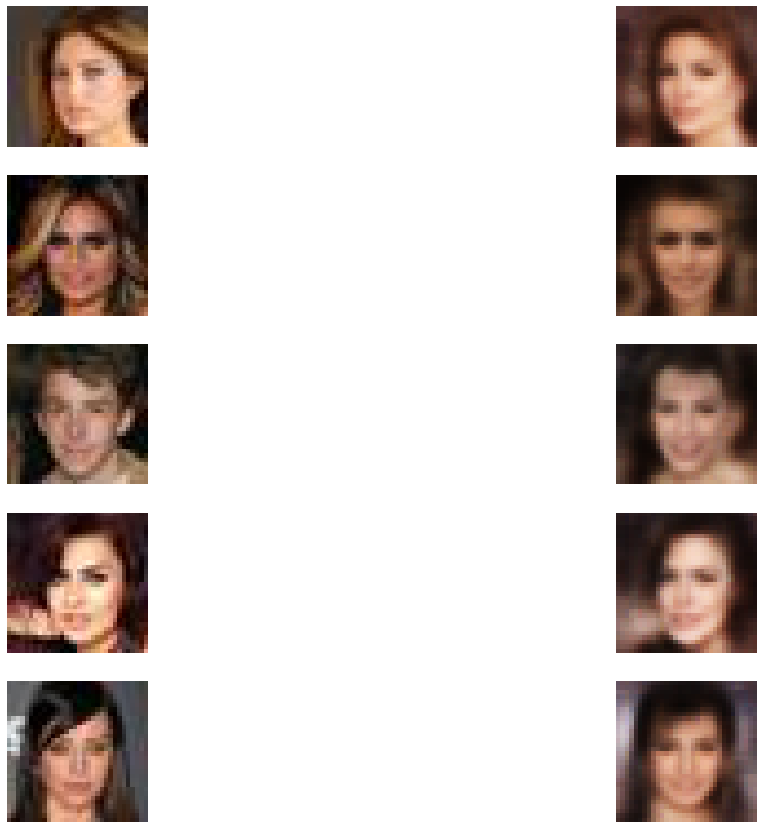

In [294]:
indices = np.random.choice(
    range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_vae.eval()
pred_img = celeba_hq_vae(gt_img)[0]


imgs_plot = [el.cpu().squeeze().numpy() for el in gt_img.reshape((5, 32, 32, 3))]
pred_plot = [el.cpu().detach().squeeze().numpy() for el in pred_img.reshape((5, 32, 32, 3))]
img = [imgs_plot, pred_plot, ]
plot_images(img, None, None)
plt.show()
plt.close()


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

Show 10 Random samples drawn from the trained CelebA-HQ VAE. You can use the `plot_images` function provided to you.

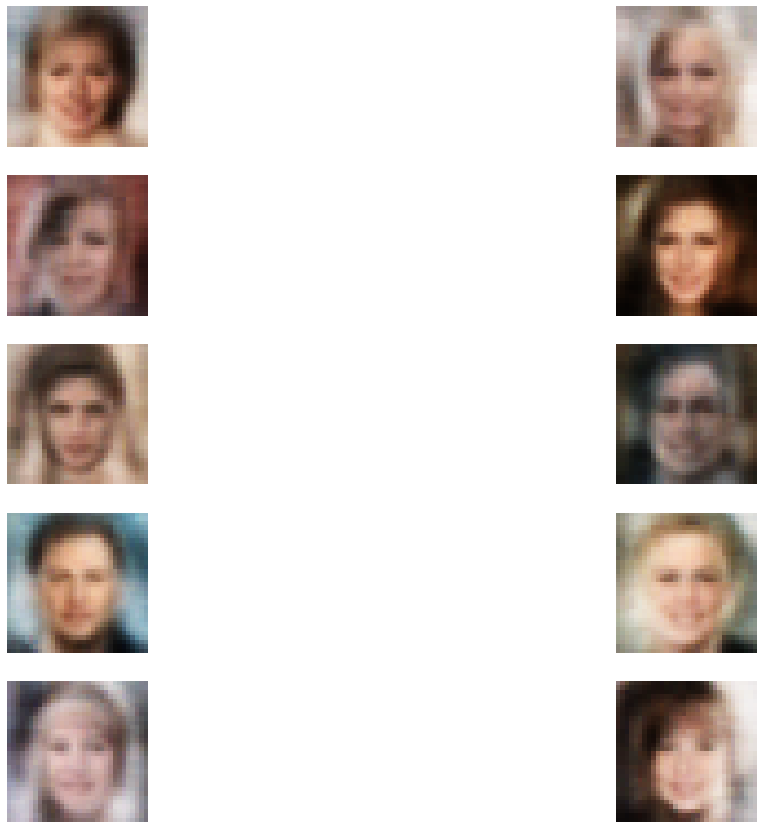

In [299]:
number_of_samples = 10

# solution

latent_size = 1024 # bottleneck size
rand_features = torch.randn(number_of_samples, latent_size).to(device)

celeba_hq_vae.eval()
new_imgs = celeba_hq_vae.decoder(rand_features)

pred_plot = [el.cpu().detach().squeeze().numpy() for el in new_imgs.reshape((10, 32, 32, 3))]
img = [pred_plot[:5], pred_plot[5:], ]

plot_images(img, None, None)
plt.show()
plt.close()
# end_solution


**Question 3.e**
<a name='question3e'></a>

i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

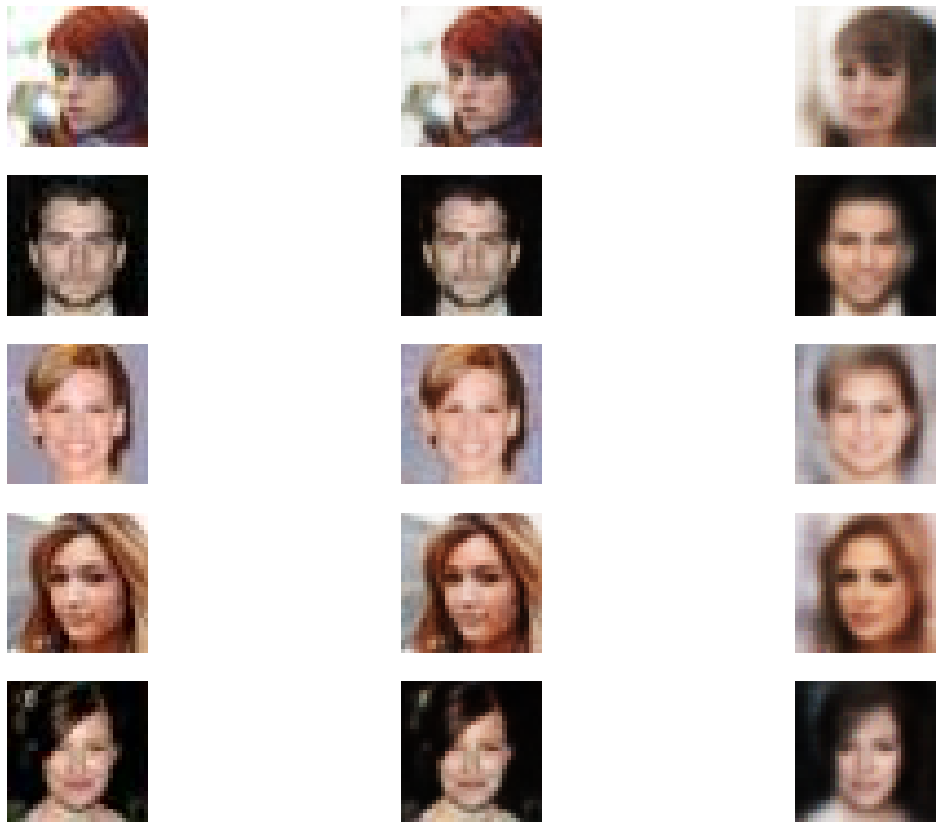

In [301]:
# solution
indices = np.random.choice(
    range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_autoencoder.eval()
celeba_hq_vae.eval()

ae_recon = celeba_hq_autoencoder(gt_img)
vae_recon = celeba_hq_vae(gt_img)[0]

gt_plot = [el.cpu().detach().squeeze().numpy() for el in gt_img.reshape((5, 32, 32, 3))]
ae_plot = [el.cpu().detach().squeeze().numpy() for el in ae_recon.reshape((5, 32, 32, 3))]
vae_plot = [el.cpu().detach().squeeze().numpy() for el in vae_recon.reshape((5, 32, 32, 3))]
img = [gt_plot, ae_plot, vae_plot]
plot_images(img, None, None)
plt.show()
plt.close()
# end_solution


ii. Compare the quality of generations by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. 
**Note: Do independent research and use appropriate mechanism to sample from the bottleneck space of the AE.**

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

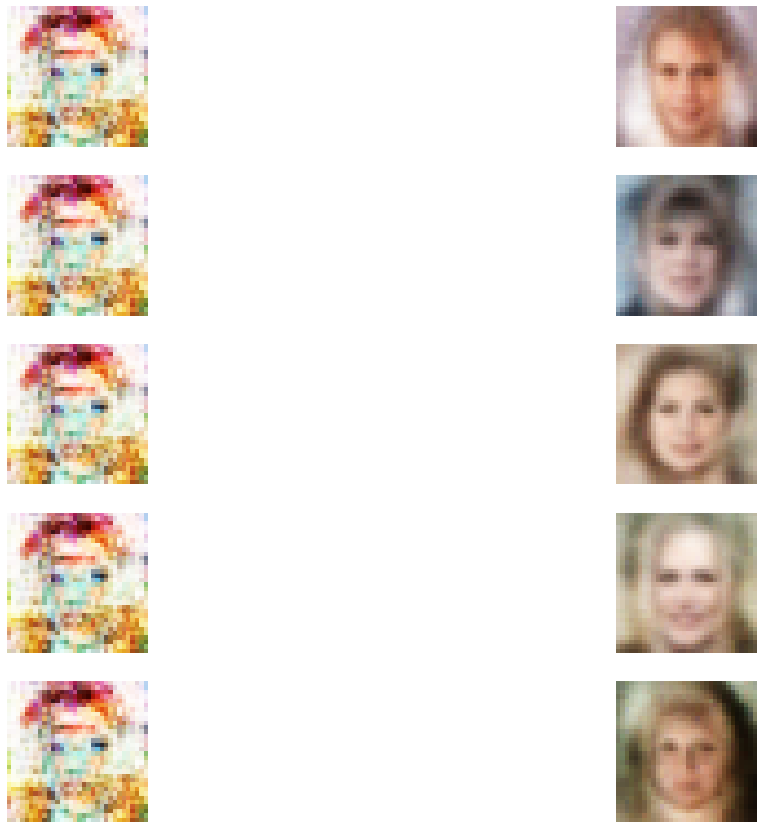

In [311]:
#solution
latent_size = 1024 # bottleneck size
number_of_samples = 5


rand_features = torch.randn(number_of_samples, latent_size).to(device)


celeba_hq_vae.eval()
celeba_hq_autoencoder.eval()

# Get the weight and bias of encoder's fully-connection layer of autoencoder
weight = celeba_hq_autoencoder.state_dict()['enc_fc.1.weight']
bias = celeba_hq_autoencoder.state_dict()['enc_fc.1.bias']

z = []
for i in range(number_of_samples):
    rand_ae_latent = torch.rand((32768)).to(device) # Generate random sample
    z.append(torch.matmul(rand_ae_latent, weight.T)+bias) 

batch_ae = torch.stack(z, dim=0).to(device)

ae_imgs = celeba_hq_autoencoder.decoder(batch_ae)
vae_imgs = celeba_hq_vae.decoder(rand_features)

ae_plot = [el.cpu().detach().squeeze().numpy() for el in ae_imgs.reshape((number_of_samples, 32, 32, 3))]
vae_plot = [el.cpu().detach().squeeze().numpy() for el in vae_imgs.reshape((number_of_samples, 32, 32, 3))]
img = [ae_plot, vae_plot, ]

plot_images(img, None, None)
plt.show()
plt.close()
#end_solution

**Question 3.f**
<a name='questionff'></a>

In your own words, describe your design choices for Q3a. and Q3d. This can include:
1. The architectures you used for the Encoder and Decoder in both
2. The hyperparams used for training, etc.

Explain how and why the models are different? Write no more than 15 sentences and feel free to use figures/plots/math(latex) for explanation.

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

My models can be downloaded at the link:
https://drive.google.com/drive/folders/1soJ0oemNIQYHNP1PopCdCwMChrfW6n04?usp=sharing

_Your reply:_ 

The architectures of autoencoder and variational autoencoder are shown by below tables.
| AE | LAYER NUMBER | CHANNEL CHANGES | NON-LINEAR FUNCTIONS | BATCHNORM |
| :---: | :---: | :---: | :---: | :---: |
| Encoder | 4 | 3->32->64 | LeakyRelu & Sigmoid | True |
| Decoder | 2 | 64->32->3 | LeakyRelu & Sigmoid | True |

In the framework of the autoencoder, I choose to use for loops to build the encoder and decoder networks, but in VAE, I choose to manually write the network structure of each layer, so that it is convenient to modify the model of each layer during the debugging process. On the basis of AE framework, I added one more convolutional layer to VAE in order to better learn from input features.

| VAE | LAYER NUMBER | CHANNEL CHANGES | NON-LINEAR FUNCTIONS | BATCHNORM |
| :---: | :---: | :---: | :---: | :---: |
| Encoder | 3 | 3->32->64->128 | LeakyRelu & Sigmoid | True |
| Decoder | 3 | 128->64->32->3 | LeakyRelu & Sigmoid | True |

The table below shows different hyperparams used for training these two models.

| MODELS | EPOCHS | BATCH SIZE | BOTTLENECK SIZE | LEARNING RATE | LOSS WEIGHT |
| :---: | :---: | :---: | :---: | :---: |:---: |
| AE | 20 | 128 | 256| 0.01 | / |
| VAE | 50 | 128 | 1024 | 0.001 | 0.1 on kl loss|

Compared with AE, VAE adds a Reparametrization Trick which generates $z = \mu + \sigma*\varepsilon$ after the linear operations of encoder and feed $z$ into the decoder. VAE  also adds similarity loss $KL Divergence = D_{KL}(N(\mu, \sigma)||N(0, I))$ during the training process, in order to make the reconstructed images not only similar to the original images, but also make the data of the latent space conform to the normal distribution.
While data from bottleneck space of autoencoder doesn't follow any distribution.